In [1]:
import jax.numpy as jnp
from typing import Tuple
from datasets import load_dataset
from jax.nn import one_hot

def load_mnist_data() -> Tuple[jnp.ndarray, jnp.ndarray, jnp.ndarray, jnp.ndarray]:
    """Load and preprocess MNIST dataset using Hugging Face datasets with JAX format."""
    print("Loading MNIST dataset from Hugging Face with JAX format...")
    
    # Load dataset from Hugging Face with JAX format
    mnist_dataset = load_dataset("mnist", cache_dir="~/.cache/huggingface/datasets").with_format("jax")
    
    # Extract train and test sets directly as JAX arrays
    train_data = mnist_dataset["train"]
    test_data = mnist_dataset["test"]
    
    # Extract images and reshape to 28x28
    x_train = jnp.array([img.reshape(28, 28) for img in train_data["image"]])
    y_train = jnp.array(train_data["label"])
    
    x_test = jnp.array([img.reshape(28, 28) for img in test_data["image"]])
    y_test = jnp.array(test_data["label"])
    
    # Normalize data
    x_train = x_train.astype(jnp.float32) / 255.0
    x_test = x_test.astype(jnp.float32) / 255.0
    
    # Convert labels to one-hot encoding
    y_train = one_hot(y_train, 10)
    y_test = one_hot(y_test, 10)
    
    print("x_train shape:", x_train.shape)
    print("y_train shape:", y_train.shape)
    print("x_test shape:", x_test.shape)
    print("y_test shape:", y_test.shape)
    
    return x_train, y_train, x_test, y_test
x_train, y_train, x_test, y_test = load_mnist_data()

/home/cwhy/Projects/Jax/picojam/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loading MNIST dataset from Hugging Face with JAX format...
x_train shape: (60000, 28, 28)
y_train shape: (60000, 10)
x_test shape: (10000, 28, 28)
y_test shape: (10000, 10)


In [16]:
import matplotlib.pyplot as plt

def visualize_generated_images(generated_images: dict, 
                              closest_real_images: dict,
                              img_height: int = 28, 
                              img_width: int = 28):
    """
    Visualize generated images and their closest real matches.
    Shows a row of generated images and a row of closest real matches.
    
    Args:
        generated_images: Dictionary mapping title -> generated image
        closest_real_images: Dictionary mapping title -> closest real image
        img_height: Height of images for reshaping
        img_width: Width of images for reshaping
    """
    n = len(generated_images)
    titles = list(generated_images.keys())
    
    # Plot in two rows: generated (top) and closest real (bottom)
    fig, axs = plt.subplots(2, n, figsize=(3*n, 6))
    
    # First row: generated images
    for i, title in enumerate(titles):
        img = generated_images[title].reshape(img_height, img_width)
        axs[0, i].imshow(img, cmap='gray')
        axs[0, i].set_title(title, fontsize=8)
        axs[0, i].axis('off')
    
    # Second row: closest real matches
    for i, title in enumerate(titles):
        axs[1, i].imshow(closest_real_images[title], cmap='gray')
        axs[1, i].set_title(f"Closest Real", fontsize=10)
        axs[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()

In [5]:

import faiss
import numpy as np

class FaissState:
    def __init__(self, dataset: jnp.ndarray):
        # Precompute flattened dataset
        self.dataset_original = dataset
        self.dataset_flat_jax = dataset.reshape(dataset.shape[0], -1)
        self.dataset_flat_np = np.asarray(self.dataset_flat_jax, dtype=np.float32)
        
        # Build Faiss index (only used for visualization)
        self.index = faiss.IndexFlatL2(self.dataset_flat_np.shape[1])
        self.index.add(self.dataset_flat_np)

def find_closest_real_images(generated_images: jnp.ndarray, 
                            faiss_state: FaissState) -> jnp.ndarray:
    """
    Find the closest real images from the dataset for each generated image.
    
    Args:
        generated_images: Array of generated images (n, d) where d is the flattened image dimension
        faiss_state: FaissState object containing the dataset
    
    Returns:
        Array of closest real images from the dataset
    """
    n = generated_images.shape[0]
    generated_flat = generated_images.reshape(n, -1)  # Ensure flat shape
    dataset_flat = faiss_state.dataset_flat_np
    
    # Convert to numpy for efficient operations
    gen_np = np.array(generated_flat)
    
    closest_indices = []
    for i in range(n):
        diffs = dataset_flat - gen_np[i]
        distances = np.sqrt(np.sum(diffs**2, axis=1))
        closest_idx = np.argmin(distances)
        closest_indices.append(closest_idx)
    
    # Get the closest real images
    closest_real_images = jnp.array([faiss_state.dataset_original[idx] for idx in closest_indices])
    
    return closest_real_images

In [17]:
import jax.numpy as jnp
from typing import Dict, List


def generate_noise_title(noise_vector: jnp.ndarray) -> str:
    """
    Generate a title for a noise vector by finding the indices of all 1s.
    
    Args:
        noise_vector: Binary noise vector (0s and 1s)
    
    Returns:
        String title with comma-separated sorted indices of 1s
    """
    # Find indices where value is 1
    indices = np.where(noise_vector == 1)[0]
    
    # Sort the indices
    sorted_indices = np.sort(indices)
    
    # Join indices with commas
    title = ",".join(map(str, sorted_indices))
    
    # If the title would be too long, truncate it
    if len(title) > 30:
        title = title[:27] + "..."
    
    return title


def generate_and_visualize(forward_fn, params: List[Dict[str, jnp.ndarray]], 
                          faiss_state: FaissState, key: jnp.ndarray, 
                          noise_fn, n: int = 5, latent_dim: int = 50,
                          img_height: int = 28, img_width: int = 28):
    """
    Generate random images using the provided noise function, find their closest real matches, and visualize them.
    Generates titles for images based on the indices of 1s in the noise vector.
    
    Args:
        forward_fn: Function that takes parameters and inputs and returns generated images
        params: Model parameters
        faiss_state: FaissState object containing the dataset
        key: Random key
        noise_fn: Function to generate noise
        n: Number of images to generate
        latent_dim: Dimension of the latent space
        img_height: Height of images
        img_width: Width of images
    """
    # Generate noise using the provided function
    noise = noise_fn(key, n, latent_dim)
    
    # Generate images
    raw_generated_images = forward_fn(params, noise)
    
    # Find closest real images using the original function
    closest_real_images_array = find_closest_real_images(raw_generated_images, faiss_state)
    
    # Create dictionaries with titles from the arrays
    generated_images_dict = {}
    closest_real_images_dict = {}
    
    for i in range(n):
        # Generate title based on noise vector
        title = generate_noise_title(noise[i])
        generated_images_dict[title] = raw_generated_images[i]
        closest_real_images_dict[title] = closest_real_images_array[i]
    
    # Visualize with titles
    visualize_generated_images(generated_images_dict, closest_real_images_dict, img_height, img_width)


In [26]:


# Function to collect parameter history during training
def track_parameter_history(state_history, tracking_interval=5):
    """
    Extract parameter history from training state history at specified intervals.
    
    Args:
        state_history: List of TrainState objects collected during training
        tracking_interval: How often to sample the history
    
    Returns:
        List of parameters at specified intervals
    """
    params_history = []
    for i in range(0, len(state_history), tracking_interval):
        params_history.append(state_history[i].params)
    return params_history

In [12]:
import jax.numpy as jnp
from jax import random, jit, value_and_grad, vmap
import optax
from typing import Tuple, Dict, List, NamedTuple
from functools import partial
from jax.nn import relu, sigmoid


def init_mlp_params(rng: jnp.ndarray, layer_sizes: List[int]) -> List[Dict[str, jnp.ndarray]]:
    """Initialize parameters for a simple MLP."""
    keys = random.split(rng, len(layer_sizes) - 1)
    params = []
    
    for i, (in_size, out_size) in enumerate(zip(layer_sizes[:-1], layer_sizes[1:])):
        # Initialize weights with He initialization
        w_key, b_key = random.split(keys[i])
        w = random.normal(w_key, (in_size, out_size)) * jnp.sqrt(2.0 / in_size)
        b = jnp.zeros(out_size)
        params.append({"w": w, "b": b})
    
    return params

@jit
def mlp_forward(params: List[Dict[str, jnp.ndarray]], inputs: jnp.ndarray) -> jnp.ndarray:
    """Forward pass through the MLP."""
    activations = inputs
    
    # Apply all but the last layer with ReLU
    for layer_params in params[:-1]:
        activations = relu(jnp.dot(activations, layer_params["w"]) + layer_params["b"])
    
    # Apply the last layer with sigmoid for pixel values in [0, 1]
    final_output = sigmoid(jnp.dot(activations, params[-1]["w"]) + params[-1]["b"])
    
    return final_output

# Vectorize the forward pass for efficient batch processing
vmap_mlp_forward = jit(vmap(lambda p, x: mlp_forward(p, x), in_axes=(None, 0)))

@jit
def mse_loss(generated: jnp.ndarray, target: jnp.ndarray) -> jnp.ndarray:
    """Compute MSE loss between generated and target images."""
    return jnp.mean((generated - target) ** 2)

@jit
def compute_jax_loss(params: List[Dict[str, jnp.ndarray]], noise: jnp.ndarray, 
                     targets: jnp.ndarray) -> jnp.ndarray:
    """Compute loss for a batch using pure JAX operations."""
    # Generate images
    generated = mlp_forward(params, noise)
    
    # Reshape if needed
    if generated.shape[-1] == 784 and targets.shape[-1] != 784:
        generated = generated.reshape(generated.shape[0], 28, 28)
    
    # Compute MSE loss
    return mse_loss(generated, targets)

# Define data structures for type hints
class TrainState(NamedTuple):
    params: List[Dict[str, jnp.ndarray]]
    opt_state: optax.OptState
    step: int

@partial(jit, static_argnums=(3,))
def update_step(state: TrainState, noise: jnp.ndarray, targets: jnp.ndarray, 
                optimizer: optax.GradientTransformation) -> Tuple[TrainState, Dict]:
    """JIT-compiled update step using pure JAX operations."""
    # Define loss function
    def loss_fn(params):
        return compute_jax_loss(params, noise, targets)
    
    # Compute gradients
    loss, grads = value_and_grad(loss_fn)(state.params)
    
    # Update parameters
    updates, opt_state = optimizer.update(grads, state.opt_state)
    params = optax.apply_updates(state.params, updates)
    
    # Create new state
    new_state = TrainState(
        params=params,
        opt_state=opt_state,
        step=state.step + 1
    )
    
    return new_state, {"loss": loss}

In [14]:
def sample_real_images(faiss_state: FaissState, batch_size: int, key: jnp.ndarray) -> Tuple[jnp.ndarray, jnp.ndarray]:
    """
    Sample a batch of real images from the dataset.
    
    Args:
        faiss_state: FaissState object containing the dataset
        batch_size: Number of real images to sample
        key: Random key
    
    Returns:
        Tuple of (sampled real images, indices of sampled images)
    """
    dataset_size = faiss_state.dataset_original.shape[0]
    real_indices = random.choice(key, jnp.arange(dataset_size), 
                                shape=(batch_size,), replace=False)
    real_images = faiss_state.dataset_original[real_indices]
    return real_images, real_indices


def generate_image_pool(forward_fn, params: List[Dict[str, jnp.ndarray]], 
                       pool_size: int, key: jnp.ndarray, 
                       noise_fn, latent_dim: int = 50) -> Tuple[jnp.ndarray, jnp.ndarray]:
    """
    Generate a pool of images using the provided noise generation function.
    
    Args:
        forward_fn: Function to generate images from noise
        params: Model parameters
        pool_size: Number of images to generate
        key: Random key
        noise_fn: Function to generate noise
        latent_dim: Dimension of latent noise vectors
    
    Returns:
        Tuple of (generated images, noise vectors used)
    """
    # Generate noise using the provided function
    noise_pool = noise_fn(key, pool_size, latent_dim)
    
    # Generate images using forward pass
    generated_pool = forward_fn(params, noise_pool)
    
    return generated_pool, noise_pool



def find_closest_generated_images(real_images: jnp.ndarray, generated_pool: jnp.ndarray, 
                                 min_distance: float = 0.01) -> Tuple[np.ndarray, np.ndarray]:
    """
    For each real image, find the closest generated image with a minimum distance threshold.
    
    Args:
        real_images: Array of real images (batch_size, d)
        generated_pool: Array of generated images (pool_size, d)
        min_distance: Minimum distance threshold to avoid too similar matches
    
    Returns:
        Tuple of (indices of matched generated images, selection mask array)
    """
    batch_size = real_images.shape[0]
    pool_size = generated_pool.shape[0]
    
    # Ensure flat representations
    real_flat = real_images.reshape(batch_size, -1)
    generated_pool_flat = generated_pool.reshape(pool_size, -1)
    
    # Convert to numpy for efficient operations
    real_np = np.array(real_flat)
    gen_np = np.array(generated_pool_flat)
    
    # Find closest generated image for each real image
    matched_indices = []
    
    for i in range(batch_size):
        # Calculate distances to all generated images
        diffs = gen_np - real_np[i]
        distances = np.sqrt(np.sum(diffs**2, axis=1))
        
        # Filter out distances that are too small
        valid_distances = distances.copy()
        too_close_mask = valid_distances < min_distance
        
        if np.all(too_close_mask):
            # If all distances are too small, use the original closest
            closest_idx = np.argmin(distances)
        else:
            # Set too-close distances to infinity so they won't be selected
            valid_distances[too_close_mask] = np.inf
            
            # Find index of closest generated image that meets the minimum distance threshold
            closest_idx = np.argmin(valid_distances)
        
        matched_indices.append(closest_idx)
    
    # Create selection labels (1 for selected noise, 0 for non-selected)
    selection_labels = np.zeros(pool_size)
    for idx in matched_indices:
        selection_labels[idx] = 1
    
    return np.array(matched_indices), selection_labels

def reversed_matching_train_step(state: TrainState, faiss_state: FaissState, 
                                optimizer: optax.GradientTransformation, 
                                forward_fn, update_fn, noise_fn,
                                key: jnp.ndarray,
                                batch_size: int, 
                                pool_size_multiplier: int = 4,
                                latent_dim: int = 50,
                                min_distance: float = 0.01) -> Tuple[TrainState, Dict, Tuple[jnp.ndarray, jnp.ndarray]]:
    """
    Reversed matching training step that finds closest generated images to real ones and updates the generator.
    
    Args:
        state: TrainState containing model parameters
        faiss_state: FaissState object containing the dataset
        optimizer: Optimization algorithm
        forward_fn: Function to generate images from noise
        update_fn: Function to update model parameters
        noise_fn: Function to generate noise
        key: Random key
        batch_size: Number of real images to use
        pool_size_multiplier: Multiplier for the generated pool size relative to batch_size
        latent_dim: Dimension of latent noise vectors
        min_distance: Minimum distance threshold for matching
        
    Returns:
        Tuple of (updated state, metrics, (noise vectors, selection labels))
    """
    # Split the random key
    key, subkey1, subkey2 = random.split(key, 3)
    
    # 1. Sample a batch of real images
    real_images, _ = sample_real_images(faiss_state, batch_size, subkey1)
    
    # 2. Generate a larger pool of images using the provided noise function
    generated_pool_size = batch_size * pool_size_multiplier
    generated_pool, noise_pool = generate_image_pool(
        forward_fn, state.params, generated_pool_size, subkey2, noise_fn, latent_dim
    )
    
    # 3. For each real image, find the closest generated image
    matched_indices, selection_labels = find_closest_generated_images(
        real_images, generated_pool, min_distance
    )
    
    # Extract matched noise vectors
    matched_noise = jnp.array([noise_pool[idx] for idx in matched_indices])
    selection_labels = jnp.array(selection_labels)
    
    # 4. Update parameters using the update step
    new_state, metrics = update_fn(state, matched_noise, real_images, optimizer)
    
    # 5. Return state, metrics, and noise data for analysis
    return new_state, metrics, (noise_pool, selection_labels)

Starting MNIST Generator with Reversed Image Matching
Dataset prepared in 0.10 seconds
Model initialized in 0.16 seconds
Warming up JIT compiler...
JIT warmup completed in 1.03 seconds
Starting training with 35 epochs, 100 steps per epoch
Using reversed image matching with batch size 64
Epoch 1/35, Step 1/100, Loss: 0.2306, Step Time: 2.623s
Epoch 1/35, Step 11/100, Loss: 0.0638, Step Time: 0.016s
Epoch 1/35, Step 21/100, Loss: 0.0602, Step Time: 0.016s
Epoch 1/35, Step 31/100, Loss: 0.0630, Step Time: 0.016s
Epoch 1/35, Step 41/100, Loss: 0.0503, Step Time: 0.016s
Epoch 1/35, Step 51/100, Loss: 0.0494, Step Time: 0.016s
Epoch 1/35, Step 61/100, Loss: 0.0500, Step Time: 0.016s
Epoch 1/35, Step 71/100, Loss: 0.0487, Step Time: 0.016s
Epoch 1/35, Step 81/100, Loss: 0.0448, Step Time: 0.016s
Epoch 1/35, Step 91/100, Loss: 0.0481, Step Time: 0.016s
Epoch 1/35 completed in 4.16s, Avg Loss: 0.0589


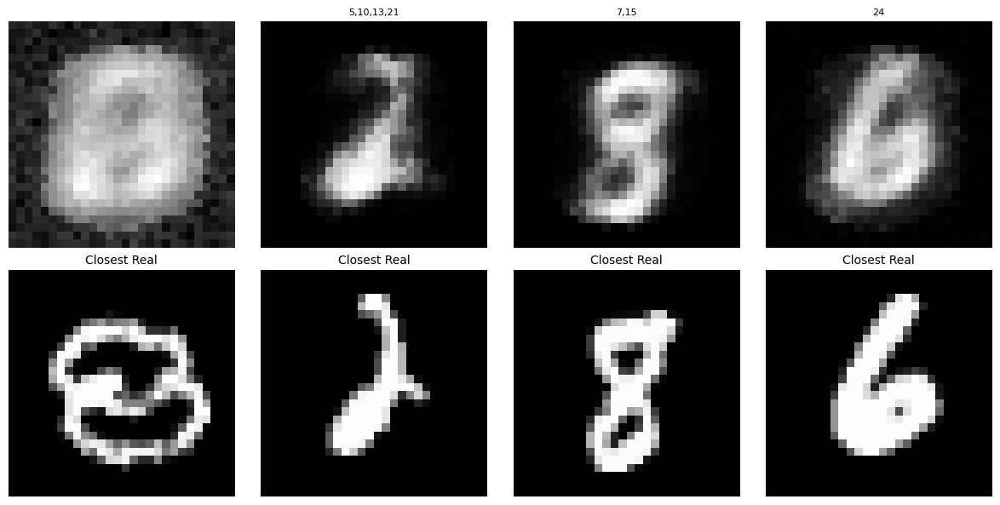

Epoch 2/35, Step 1/100, Loss: 0.0452, Step Time: 0.018s
Epoch 2/35, Step 11/100, Loss: 0.0470, Step Time: 0.016s
Epoch 2/35, Step 21/100, Loss: 0.0448, Step Time: 0.016s
Epoch 2/35, Step 31/100, Loss: 0.0437, Step Time: 0.016s
Epoch 2/35, Step 41/100, Loss: 0.0433, Step Time: 0.016s
Epoch 2/35, Step 51/100, Loss: 0.0441, Step Time: 0.017s
Epoch 2/35, Step 61/100, Loss: 0.0452, Step Time: 0.016s
Epoch 2/35, Step 71/100, Loss: 0.0386, Step Time: 0.016s
Epoch 2/35, Step 81/100, Loss: 0.0433, Step Time: 0.017s
Epoch 2/35, Step 91/100, Loss: 0.0440, Step Time: 0.016s
Epoch 2/35 completed in 1.57s, Avg Loss: 0.0443
Epoch 3/35, Step 1/100, Loss: 0.0438, Step Time: 0.017s
Epoch 3/35, Step 11/100, Loss: 0.0440, Step Time: 0.017s
Epoch 3/35, Step 21/100, Loss: 0.0425, Step Time: 0.017s
Epoch 3/35, Step 31/100, Loss: 0.0372, Step Time: 0.016s
Epoch 3/35, Step 41/100, Loss: 0.0434, Step Time: 0.017s
Epoch 3/35, Step 51/100, Loss: 0.0410, Step Time: 0.016s
Epoch 3/35, Step 61/100, Loss: 0.0424, Ste

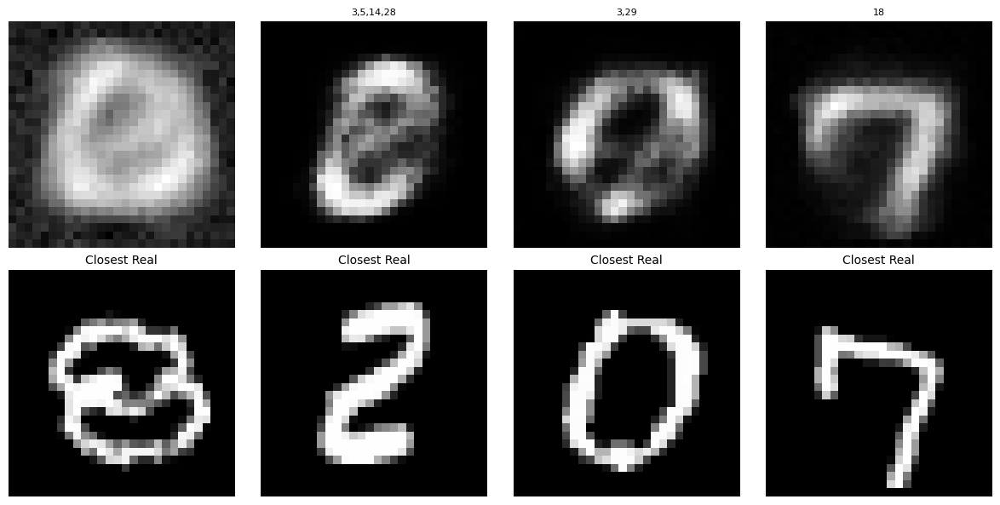

Epoch 6/35, Step 1/100, Loss: 0.0421, Step Time: 0.019s
Epoch 6/35, Step 11/100, Loss: 0.0391, Step Time: 0.017s
Epoch 6/35, Step 21/100, Loss: 0.0434, Step Time: 0.017s
Epoch 6/35, Step 31/100, Loss: 0.0364, Step Time: 0.016s
Epoch 6/35, Step 41/100, Loss: 0.0416, Step Time: 0.017s
Epoch 6/35, Step 51/100, Loss: 0.0411, Step Time: 0.020s
Epoch 6/35, Step 61/100, Loss: 0.0446, Step Time: 0.017s
Epoch 6/35, Step 71/100, Loss: 0.0376, Step Time: 0.018s
Epoch 6/35, Step 81/100, Loss: 0.0378, Step Time: 0.017s
Epoch 6/35, Step 91/100, Loss: 0.0366, Step Time: 0.017s
Epoch 6/35 completed in 1.65s, Avg Loss: 0.0403
Epoch 7/35, Step 1/100, Loss: 0.0402, Step Time: 0.017s
Epoch 7/35, Step 11/100, Loss: 0.0381, Step Time: 0.017s
Epoch 7/35, Step 21/100, Loss: 0.0399, Step Time: 0.017s
Epoch 7/35, Step 31/100, Loss: 0.0413, Step Time: 0.017s
Epoch 7/35, Step 41/100, Loss: 0.0426, Step Time: 0.019s
Epoch 7/35, Step 51/100, Loss: 0.0415, Step Time: 0.017s
Epoch 7/35, Step 61/100, Loss: 0.0380, Ste

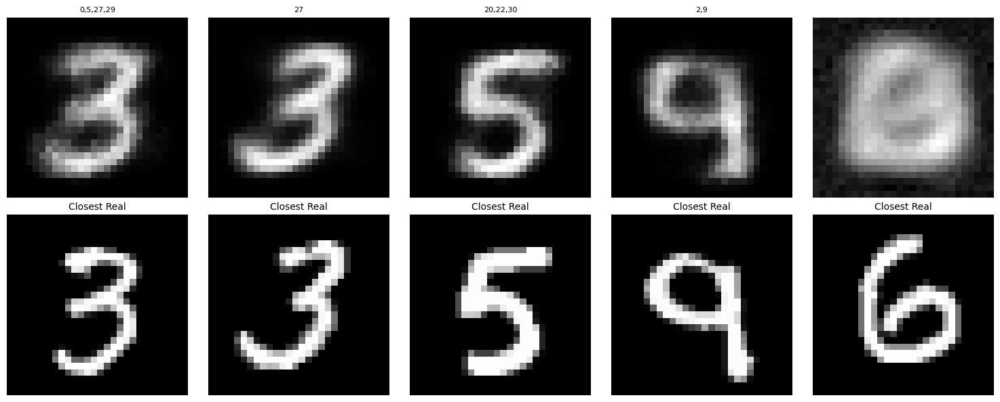

Epoch 11/35, Step 1/100, Loss: 0.0395, Step Time: 0.017s
Epoch 11/35, Step 11/100, Loss: 0.0380, Step Time: 0.016s
Epoch 11/35, Step 21/100, Loss: 0.0362, Step Time: 0.017s
Epoch 11/35, Step 31/100, Loss: 0.0387, Step Time: 0.016s
Epoch 11/35, Step 41/100, Loss: 0.0379, Step Time: 0.017s
Epoch 11/35, Step 51/100, Loss: 0.0411, Step Time: 0.016s
Epoch 11/35, Step 61/100, Loss: 0.0387, Step Time: 0.017s
Epoch 11/35, Step 71/100, Loss: 0.0407, Step Time: 0.016s
Epoch 11/35, Step 81/100, Loss: 0.0369, Step Time: 0.017s
Epoch 11/35, Step 91/100, Loss: 0.0404, Step Time: 0.017s
Epoch 11/35 completed in 1.58s, Avg Loss: 0.0390
Epoch 12/35, Step 1/100, Loss: 0.0397, Step Time: 0.017s
Epoch 12/35, Step 11/100, Loss: 0.0415, Step Time: 0.017s
Epoch 12/35, Step 21/100, Loss: 0.0401, Step Time: 0.016s
Epoch 12/35, Step 31/100, Loss: 0.0371, Step Time: 0.017s
Epoch 12/35, Step 41/100, Loss: 0.0373, Step Time: 0.016s
Epoch 12/35, Step 51/100, Loss: 0.0361, Step Time: 0.017s
Epoch 12/35, Step 61/100,

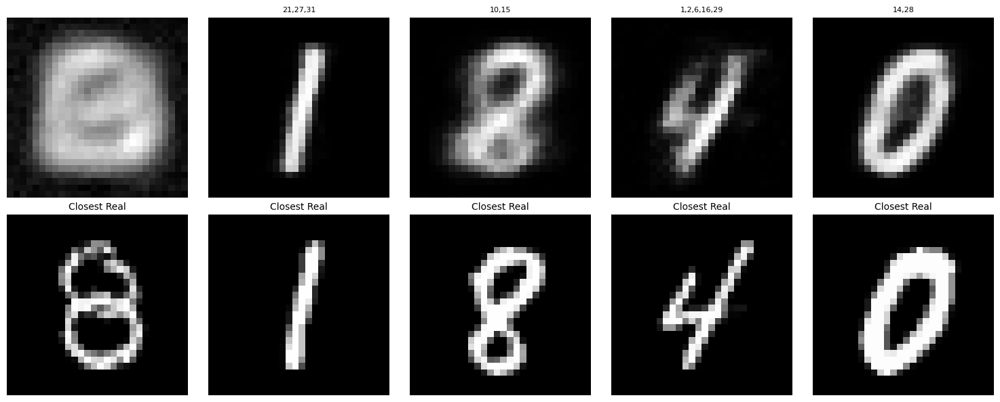

Epoch 16/35, Step 1/100, Loss: 0.0388, Step Time: 0.018s
Epoch 16/35, Step 11/100, Loss: 0.0404, Step Time: 0.016s
Epoch 16/35, Step 21/100, Loss: 0.0381, Step Time: 0.016s
Epoch 16/35, Step 31/100, Loss: 0.0407, Step Time: 0.016s
Epoch 16/35, Step 41/100, Loss: 0.0382, Step Time: 0.017s
Epoch 16/35, Step 51/100, Loss: 0.0354, Step Time: 0.017s
Epoch 16/35, Step 61/100, Loss: 0.0389, Step Time: 0.017s
Epoch 16/35, Step 71/100, Loss: 0.0362, Step Time: 0.016s
Epoch 16/35, Step 81/100, Loss: 0.0373, Step Time: 0.017s
Epoch 16/35, Step 91/100, Loss: 0.0388, Step Time: 0.016s
Epoch 16/35 completed in 1.58s, Avg Loss: 0.0386
Epoch 17/35, Step 1/100, Loss: 0.0378, Step Time: 0.017s
Epoch 17/35, Step 11/100, Loss: 0.0373, Step Time: 0.017s
Epoch 17/35, Step 21/100, Loss: 0.0400, Step Time: 0.016s
Epoch 17/35, Step 31/100, Loss: 0.0421, Step Time: 0.016s
Epoch 17/35, Step 41/100, Loss: 0.0398, Step Time: 0.017s
Epoch 17/35, Step 51/100, Loss: 0.0392, Step Time: 0.016s
Epoch 17/35, Step 61/100,

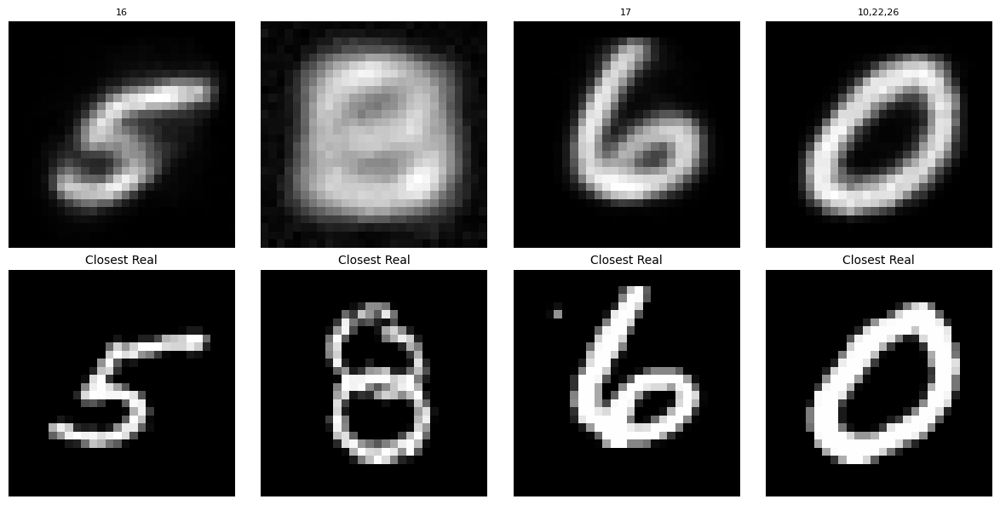

Epoch 21/35, Step 1/100, Loss: 0.0364, Step Time: 0.019s
Epoch 21/35, Step 11/100, Loss: 0.0353, Step Time: 0.016s
Epoch 21/35, Step 21/100, Loss: 0.0348, Step Time: 0.017s
Epoch 21/35, Step 31/100, Loss: 0.0393, Step Time: 0.017s
Epoch 21/35, Step 41/100, Loss: 0.0335, Step Time: 0.016s
Epoch 21/35, Step 51/100, Loss: 0.0396, Step Time: 0.016s
Epoch 21/35, Step 61/100, Loss: 0.0402, Step Time: 0.016s
Epoch 21/35, Step 71/100, Loss: 0.0369, Step Time: 0.018s
Epoch 21/35, Step 81/100, Loss: 0.0343, Step Time: 0.017s
Epoch 21/35, Step 91/100, Loss: 0.0377, Step Time: 0.018s
Epoch 21/35 completed in 1.63s, Avg Loss: 0.0379
Epoch 22/35, Step 1/100, Loss: 0.0373, Step Time: 0.017s
Epoch 22/35, Step 11/100, Loss: 0.0383, Step Time: 0.017s
Epoch 22/35, Step 21/100, Loss: 0.0361, Step Time: 0.016s
Epoch 22/35, Step 31/100, Loss: 0.0376, Step Time: 0.016s
Epoch 22/35, Step 41/100, Loss: 0.0356, Step Time: 0.017s
Epoch 22/35, Step 51/100, Loss: 0.0394, Step Time: 0.017s
Epoch 22/35, Step 61/100,

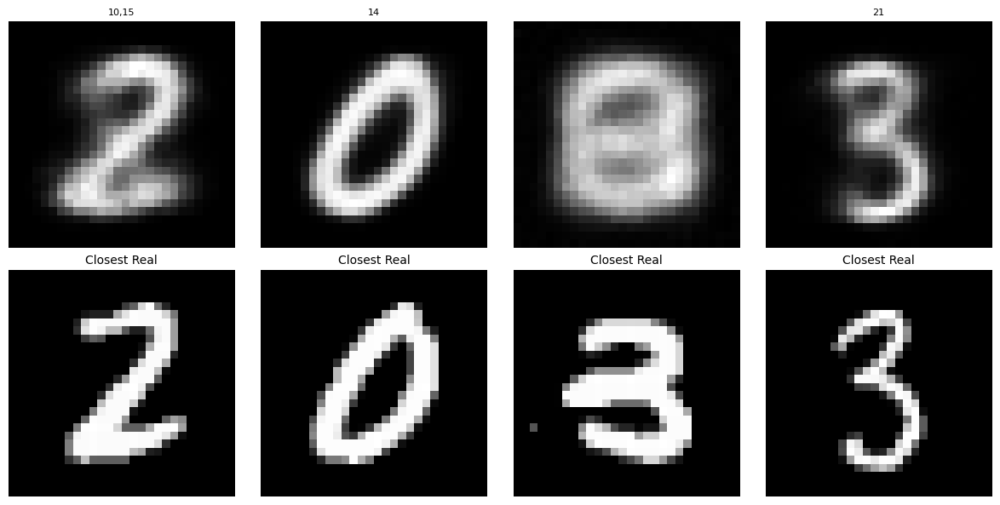

Epoch 26/35, Step 1/100, Loss: 0.0359, Step Time: 0.018s
Epoch 26/35, Step 11/100, Loss: 0.0358, Step Time: 0.017s
Epoch 26/35, Step 21/100, Loss: 0.0378, Step Time: 0.017s
Epoch 26/35, Step 31/100, Loss: 0.0371, Step Time: 0.017s
Epoch 26/35, Step 41/100, Loss: 0.0400, Step Time: 0.017s
Epoch 26/35, Step 51/100, Loss: 0.0363, Step Time: 0.017s
Epoch 26/35, Step 61/100, Loss: 0.0370, Step Time: 0.017s
Epoch 26/35, Step 71/100, Loss: 0.0369, Step Time: 0.017s
Epoch 26/35, Step 81/100, Loss: 0.0389, Step Time: 0.017s
Epoch 26/35, Step 91/100, Loss: 0.0414, Step Time: 0.017s
Epoch 26/35 completed in 1.63s, Avg Loss: 0.0378
Epoch 27/35, Step 1/100, Loss: 0.0367, Step Time: 0.017s
Epoch 27/35, Step 11/100, Loss: 0.0359, Step Time: 0.016s
Epoch 27/35, Step 21/100, Loss: 0.0356, Step Time: 0.017s
Epoch 27/35, Step 31/100, Loss: 0.0389, Step Time: 0.017s
Epoch 27/35, Step 41/100, Loss: 0.0381, Step Time: 0.017s
Epoch 27/35, Step 51/100, Loss: 0.0396, Step Time: 0.017s
Epoch 27/35, Step 61/100,

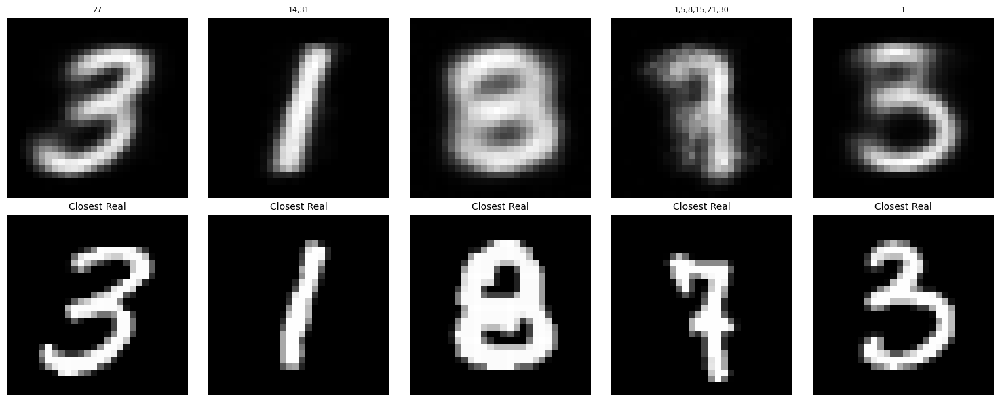

Epoch 31/35, Step 1/100, Loss: 0.0370, Step Time: 0.018s
Epoch 31/35, Step 11/100, Loss: 0.0371, Step Time: 0.017s
Epoch 31/35, Step 21/100, Loss: 0.0361, Step Time: 0.017s
Epoch 31/35, Step 31/100, Loss: 0.0336, Step Time: 0.017s
Epoch 31/35, Step 41/100, Loss: 0.0350, Step Time: 0.017s
Epoch 31/35, Step 51/100, Loss: 0.0374, Step Time: 0.017s
Epoch 31/35, Step 61/100, Loss: 0.0385, Step Time: 0.017s
Epoch 31/35, Step 71/100, Loss: 0.0390, Step Time: 0.016s
Epoch 31/35, Step 81/100, Loss: 0.0385, Step Time: 0.019s
Epoch 31/35, Step 91/100, Loss: 0.0403, Step Time: 0.016s
Epoch 31/35 completed in 1.61s, Avg Loss: 0.0375
Epoch 32/35, Step 1/100, Loss: 0.0410, Step Time: 0.018s
Epoch 32/35, Step 11/100, Loss: 0.0339, Step Time: 0.016s
Epoch 32/35, Step 21/100, Loss: 0.0399, Step Time: 0.017s
Epoch 32/35, Step 31/100, Loss: 0.0367, Step Time: 0.018s
Epoch 32/35, Step 41/100, Loss: 0.0341, Step Time: 0.018s
Epoch 32/35, Step 51/100, Loss: 0.0364, Step Time: 0.016s
Epoch 32/35, Step 61/100,

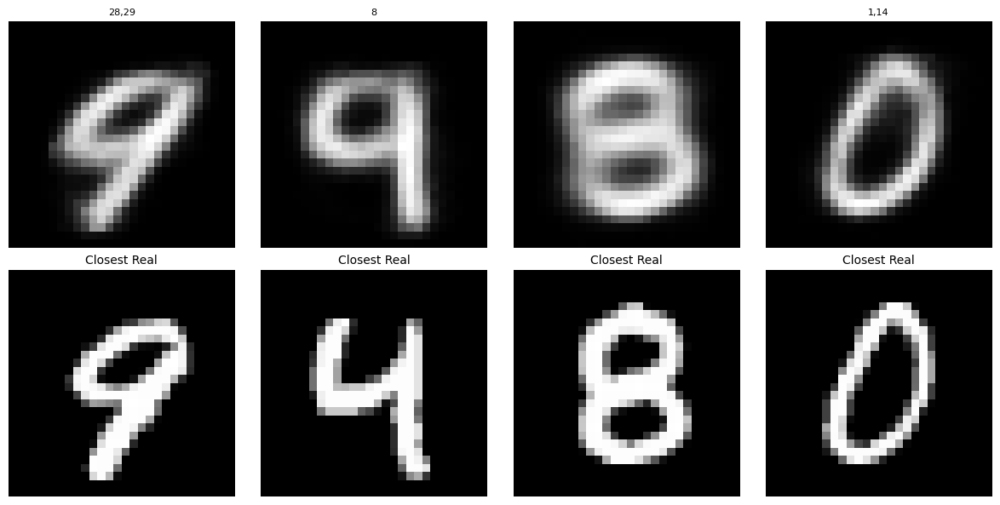

Training completed in 63.77 seconds


In [37]:
import time
import copy




print("Starting MNIST Generator with Reversed Image Matching")
start_time = time.time()

# Define master key for reproducibility
master_key = random.PRNGKey(42)

# Initialize dataset state
dataset_time = time.time()
faiss_state = FaissState(x_train)
print(f"Dataset prepared in {time.time() - dataset_time:.2f} seconds")

latent_dim = 32  # Explicitly define latent dimension
# Define MLP architecture
layer_sizes = [latent_dim, 1024, 784, 784]  # 50-dim noise -> 784 -> 784 -> 784 (28*28)

# Initialize parameters
init_time = time.time()
key, subkey = random.split(master_key)
params = init_mlp_params(subkey, layer_sizes)

# Create optimizer
learning_rate = 0.001
optimizer = optax.adam(learning_rate)
opt_state = optimizer.init(params)

# Initialize training state
state = TrainState(
    params=params,
    opt_state=opt_state,
    step=0
)
print(f"Model initialized in {time.time() - init_time:.2f} seconds")



# Define the noise function to use
def my_noise_fn(key, batch_size, latent_dim):
    """Custom noise function - using Bernoulli distribution by default"""
    return random.bernoulli(key, p=0.1, shape=(batch_size, latent_dim))
# Warm up the JIT compiler
print("Warming up JIT compiler...")
warmup_time = time.time()

# Define keys for warm-up
key, subkey1, subkey2 = random.split(key, 3)

# Warm up the noise function
noise = my_noise_fn(subkey1, 16, latent_dim)

# Warm up the forward function
dummy_images = mlp_forward(params, noise)

# Warm up the update step
dummy_targets = jnp.zeros((16, 28, 28))
_ = update_step(state, noise, dummy_targets, optimizer)

print(f"JIT warmup completed in {time.time() - warmup_time:.2f} seconds")

# Training loop with state history tracking
batch_size = 64
num_epochs = 35
steps_per_epoch = min(len(x_train) // batch_size, 100)  # Limit steps per epoch for demo

# Define the noise function to use
def my_noise_fn(key, batch_size, latent_dim):
    """Custom noise function - using Bernoulli distribution by default"""
    return random.bernoulli(key, p=0.05, shape=(batch_size, latent_dim))

print(f"Starting training with {num_epochs} epochs, {steps_per_epoch} steps per epoch")
print(f"Using reversed image matching with batch size {batch_size}")
training_start = time.time()

# Create fixed base noise for animation
key, animation_key = random.split(key)
base_noise = my_noise_fn(animation_key, 1, latent_dim)[0]

# Initialize state history list
state_history = [state]  # Start with initial state

for epoch in range(num_epochs):
    epoch_start = time.time()
    epoch_loss = 0.0
    
    # Collect noise data for this epoch
    epoch_noise_data = []
    
    for step in range(steps_per_epoch):
        step_start = time.time()
        
        # Update model with reversed matching using the new modular function
        key, subkey = random.split(key)
        
        state, metrics, noise_data = reversed_matching_train_step(
            state=state, 
            faiss_state=faiss_state, 
            optimizer=optimizer, 
            forward_fn=mlp_forward,
            update_fn=update_step,
            noise_fn=my_noise_fn,
            key=subkey, 
            batch_size=batch_size,
            pool_size_multiplier=4,
            latent_dim=latent_dim,
            min_distance=0.01
        )
        
        # Store state history for animation (not every step to save memory)
        if step % 5 == 0 or step == steps_per_epoch - 1:
            state_history.append(copy.deepcopy(state))
        
        # Store noise data for analysis
        epoch_noise_data.append((np.array(noise_data[0]), np.array(noise_data[1])))
        
        epoch_loss += metrics["loss"]
        
        if step % 10 == 0:
            print(f"Epoch {epoch+1}/{num_epochs}, Step {step+1}/{steps_per_epoch}, " +
                  f"Loss: {metrics['loss']:.4f}, " +
                  f"Step Time: {time.time() - step_start:.3f}s")
    
    avg_epoch_loss = epoch_loss / steps_per_epoch
    
    print(f"Epoch {epoch+1}/{num_epochs} completed in {time.time() - epoch_start:.2f}s, " +
          f"Avg Loss: {avg_epoch_loss:.4f}")
    
    # Visualize some generated images
    if (epoch + 1) % 5 == 0 or epoch == 0:
        # Visualize using the new modular functions
        key, subkey = random.split(key)
        
        # Generate and visualize images
        generate_and_visualize(
            forward_fn=mlp_forward,
            params=state.params,
            faiss_state=faiss_state,
            key=subkey,
            noise_fn=my_noise_fn,
            n=5,
            latent_dim=latent_dim,
            img_height=28,
            img_width=28
        )

print(f"Training completed in {time.time() - training_start:.2f} seconds")


In [40]:
def generate_valid_base_noises(key: jnp.ndarray, rows: int, noise_dim: int) -> jnp.ndarray:
    """
    Generate base noise vectors that satisfy:
    1. Not all zeros
    2. Sum less than 5
    3. All rows have different base noise patterns
    
    Args:
        key: JAX random key
        rows: Number of base noise vectors to generate
        noise_dim: Dimension of the noise vectors
        
    Returns:
        JAX array of shape (rows, noise_dim) containing valid base noise vectors
    """
    base_noises = []
    
    for i in range(rows):
        key, subkey = random.split(key)
        valid = False
        
        while not valid:
            # Create a sparse vector with a random small number of 1s
            num_ones = random.randint(subkey, shape=(), minval=1, maxval=min(5, noise_dim))
            
            key, subkey = random.split(key)
            indices = random.choice(
                subkey,
                jnp.arange(noise_dim),
                shape=(num_ones,),
                replace=False
            )
            
            # Create a zero vector
            noise = jnp.zeros(noise_dim)
            
            # Set selected indices to 1
            noise = noise.at[indices].set(1.0)
            
            # Check if conditions are met: sum between 1 and 4, and not identical to previous rows
            if jnp.sum(noise) > 0 and jnp.sum(noise) < 5 and not any(jnp.array_equal(noise, prev_noise) for prev_noise in base_noises):
                valid = True
                base_noises.append(noise)
            
            key, subkey = random.split(key)
    
    return jnp.array(base_noises)

def create_noise_mutation_grid(base_noises: jnp.ndarray, key: jnp.ndarray, 
                              rows: int = 5, cols: int = 10, 
                              mutations_per_col: int = 1) -> tuple:
    """
    Create a grid of noise vectors where:
    - First column consists of different base noise vectors for each row
    - Subsequent columns contain mutations of the base noise by adding features
    - Each column uses unique mutation patterns
    
    Args:
        base_noises: Array of base noise vectors, shape (rows, noise_dim)
        key: JAX random key
        rows: Number of rows in the grid
        cols: Number of columns in the grid
        mutations_per_col: Number of mutations to apply per column
    
    Returns:
        Tuple containing:
        - Noise grid as a JAX array with shape (rows * cols, noise_dim)
        - Base titles list
        - Column titles list
    """
    # Convert base_noises to numpy for easier mutation
    base_noises_np = np.array(base_noises)
    noise_dim = base_noises.shape[1]
    noise_grid = np.zeros((rows * cols, noise_dim), dtype=np.float32)
    
    # Create titles for base noises (one per row)
    base_titles = []
    for row in range(rows):
        base_noise = base_noises_np[row]
        base_title = generate_noise_title(base_noise)
        base_titles.append(base_title)
    
    # Create mutation indices for each column (unique across columns)
    column_mutations = []
    column_titles = []
    
    # No mutations for first column (base noise)
    column_mutations.append([])
    column_titles.append("")
    
    # Keep track of used mutation patterns to ensure uniqueness
    used_mutation_patterns = set()
    
    # Generate mutation indices for each column (2 through cols)
    for col in range(1, cols):
        valid_mutation = False
        attempts = 0
        max_attempts = 100  # Prevent infinite loops
        
        while not valid_mutation and attempts < max_attempts:
            # Get a random set of indices to ADD for this column (only '0' values can be flipped to '1')
            key, subkey = random.split(key)
            
            # Find indices where the value is 0 across all base noises
            # We'll look for indices that are 0 in at least one base noise
            zero_indices_sets = []
            for row in range(rows):
                zero_indices_sets.append(set(np.where(base_noises_np[row] == 0)[0]))
            
            # Find indices that are zero in at least one base noise
            available_indices = set()
            for zero_set in zero_indices_sets:
                available_indices = available_indices.union(zero_set)
            
            available_indices = list(available_indices)
            
            if len(available_indices) >= mutations_per_col:
                col_mutation_indices = np.array(random.choice(
                    subkey, 
                    jnp.array(available_indices), 
                    shape=(mutations_per_col,), 
                    replace=False
                ))
                
                # Convert to a hashable format for the set check
                mutation_tuple = tuple(sorted(col_mutation_indices.tolist()))
                
                # Check if this mutation pattern is unique
                if mutation_tuple not in used_mutation_patterns:
                    used_mutation_patterns.add(mutation_tuple)
                    valid_mutation = True
            
            attempts += 1
        
        if not valid_mutation:
            # If we couldn't find a unique pattern after max attempts, just use a potentially duplicate one
            col_mutation_indices = np.array(random.choice(
                subkey, 
                jnp.array(available_indices), 
                shape=(min(mutations_per_col, len(available_indices))), 
                replace=False
            ))
        
        column_mutations.append(col_mutation_indices)
        
        # Create a mutation title for this column (only additions)
        additions = []
        for idx in col_mutation_indices:
            idx = int(idx)
            additions.append(idx)
        
        additions_str = ",".join(f"+{idx}" for idx in sorted(additions))
        column_title = additions_str
        
        if len(column_title) > 30:
            column_title = column_title[:27] + "..."
            
        column_titles.append(column_title)
    
    # Fill the grid
    for row in range(rows):
        base_noise = base_noises_np[row]
        row_start_idx = row * cols
        
        # First column is the base noise
        noise_grid[row_start_idx] = base_noise
        
        # Apply mutations across all rows in each column
        for col in range(1, cols):
            mutated_noise = base_noise.copy()
            
            # Only apply mutations where the current value is 0 (additions only)
            for idx in column_mutations[col]:
                if mutated_noise[idx] == 0:
                    mutated_noise[idx] = 1
                    
            noise_grid[row_start_idx + col] = mutated_noise
    
    # Convert back to JAX array
    return jnp.array(noise_grid), base_titles, column_titles

def visualize_noise_evolution(params_history: List[List[Dict[str, jnp.ndarray]]], 
                             forward_fn, key: jnp.ndarray, noise_fn,
                             base_noises: jnp.ndarray = None,
                             rows: int = 5, cols: int = 10,
                             latent_dim: int = 50,
                             img_height: int = 28, img_width: int = 28,
                             interval: int = 200,
                             save_path: str = None,
                             display_in_notebook: bool = True):
    """
    Create an animation showing how the generated images from a fixed noise grid evolve
    during training.
    
    Args:
        params_history: List of model parameters at different training steps
        forward_fn: Function to generate images from noise
        key: Random key
        noise_fn: Function to generate noise
        base_noises: Base noises to use (if None, will generate using noise_fn)
        rows: Number of rows in the grid
        cols: Number of columns in the grid
        latent_dim: Dimension of the latent space
        img_height: Height of generated images
        img_width: Width of generated images
        interval: Interval between frames in milliseconds
        save_path: Path to save the animation (if None, will display instead)
        display_in_notebook: Whether to return HTML for notebook display
    """
    import matplotlib.animation as animation
    from IPython.display import HTML
    
    # Generate base noises if not provided (one per row)
    if base_noises is None:
        key, subkey = random.split(key)
        base_noises = noise_fn(subkey, rows, latent_dim)
    
    # Create noise grid with mutations and pre-generated titles
    key, subkey = random.split(key)
    noise_grid, base_titles, column_titles = create_noise_mutation_grid(base_noises, subkey, rows, cols)
    
    # Create the figure with more compact layout and space for row labels
    fig = plt.figure(figsize=(cols * 1.8, rows * 1.8))
    gs = fig.add_gridspec(rows, cols + 1, width_ratios=[0.4] + [1] * cols, hspace=0.1, wspace=0.1)
    
    # Create axis for each grid cell
    axes = []
    for r in range(rows):
        row_axes = []
        # Add axis for row label (vertical text)
        row_label_ax = fig.add_subplot(gs[r, 0])
        row_label_ax.axis('off')
        row_label_ax.text(0.5, 0.5, f"Base: {base_titles[r]}", 
                         rotation=90, va='center', ha='center', fontsize=7)
        
        # Add axes for images
        for c in range(cols):
            ax = fig.add_subplot(gs[r, c + 1])
            ax.axis('off')
            row_axes.append(ax)
        axes.append(row_axes)
    
    # Add column titles to the top row only
    for c in range(cols):
        if c == 0:
            title = "Base"
        else:
            title = f"Mut {c}: {column_titles[c]}"
        axes[0][c].set_title(title, fontsize=7)
    
    # Function to update the plot for each frame
    def update(frame):
        # Generate images using the current model parameters
        current_params = params_history[frame]
        images = forward_fn(current_params, noise_grid)
        images_reshaped = images.reshape(rows * cols, img_height, img_width)
        
        # Update axes with new images
        for r in range(rows):
            for c in range(cols):
                idx = r * cols + c
                axes[r][c].clear()
                axes[r][c].axis('off')
                axes[r][c].imshow(images_reshaped[idx], cmap='gray')
                
                # Only add titles to the top row
                if r == 0 and c > 0:
                    axes[r][c].set_title(f"Mut {c}: {column_titles[c]}", fontsize=7)
                elif r == 0 and c == 0:
                    axes[r][c].set_title("Base", fontsize=7)
        
        # Add a title with the current frame number
        fig.suptitle(f"Training Progress: Step {frame+1}/{len(params_history)}")
        
        return [ax for row_axes in axes for ax in row_axes]  # Return flattened list of axes
    
    # Create the animation
    anim = animation.FuncAnimation(
        fig, update, frames=len(params_history), interval=interval, blit=False
    )
    
    # Save if path is provided
    if save_path:
        # Use ffmpeg writer for MP4
        if save_path.endswith('.mp4'):
            writer = animation.FFMpegWriter(fps=1000/interval, bitrate=1800)
            anim.save(save_path, writer=writer)
        else:
            # Default to pillow for GIF if not MP4
            anim.save(save_path, writer='pillow')
    
    # For notebook display, return HTML
    if display_in_notebook:
        plt.close(fig)  # Close the figure to prevent double display
        return HTML(anim.to_jshtml())
    else:
        plt.tight_layout()
        plt.show()
        return anim

# Create the animation after training
print("Creating animation of noise evolution...")
params_history = track_parameter_history(state_history, tracking_interval=5)

n_rows = 5
n_cols = 10
# Generate valid base noises
key, subkey = random.split(key)
base_noises = generate_valid_base_noises(subkey, n_rows, latent_dim)


# Create the animation for notebook display
from IPython.display import display

# Create the animation
animation_html = visualize_noise_evolution(
    params_history=params_history,
    forward_fn=mlp_forward,
    key=animation_key,
    noise_fn=my_noise_fn,
    base_noises=base_noises,
    rows=n_rows,
    cols=n_cols,  
    latent_dim=latent_dim,
    img_height=28,
    img_width=28,
    interval=200,
    save_path="noise_evolution.mp4",  # Optional: also save to file
    display_in_notebook=True
)

# Display the animation in the notebook
display(animation_html)

Creating animation of noise evolution...
